# Test script

This script is for initial tests of qgas features

In [1]:
using Revise
using Formatting
using LinearAlgebra

import QGas
import QGas.FileIO as FileIO

import Plots

## Setup and testing

Here I import the relevent packages and test that we can load and process files

In [4]:
filename = "/Users/ispielma/Downloads/0006/"*"2022-09-20_0006_SimpleMot_"
datafiles = FileIO.DataFiles(filename, 0, 1)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d")

2-element Vector{String}:
 "/Users/ispielma/Downloads/0006/2022-09-20_0006_SimpleMot_000.h5"
 "/Users/ispielma/Downloads/0006/2022-09-20_0006_SimpleMot_001.h5"

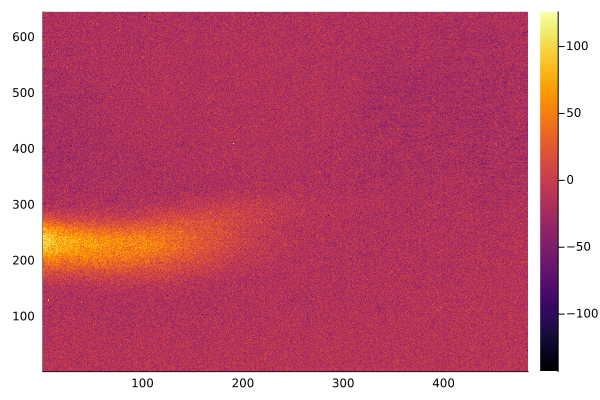

In [5]:
MOT_x_grp = FileIO.ImageGroup("MOT_x", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"])
MOT_y_grp = FileIO.ImageGroup("MOT_y", "absorption", ["MOT_TOF", "MOT_TOF_dark", "MOT_TOF_probe"])
MOT_z_grp = FileIO.ImageGroup("MOT_z", "fluorescence", ["MOT", "MOT_dark", "cMOT", "cMOT_dark"])
imagegroups = [MOT_x_grp, ];
MOT_data = FileIO.getimages(filenames[1], imagegroups)
MOT_fl_x = convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["MOT"]) - convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["cMOT_dark"]);
Plots.heatmap(MOT_fl_x)


## Analysis

OK!  We can open files.  Now I want to process a large dataset

In [6]:
filename = "/Users/ispielma/Downloads/0006/"*"2022-09-20_0006_SimpleMot_"
datafiles = FileIO.DataFiles(filename, 0, 999)
filenames =  FileIO.FileNameArray(datafiles, formatstring= "0>3d");
print(filenames[1])

/Users/ispielma/Downloads/0006/2022-09-20_0006_SimpleMot_000.h5

In [27]:
shape = (size(filenames)...,size(MOT_fl_x)...)
images = zeros(Int16, shape )

for (i, file) in enumerate(filenames)
    MOT_data = FileIO.getimages(file, MOT_x_grp)
    MOT_fl_x = convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["MOT"]) - convert(Matrix{Int16}, MOT_data["MOT_x"]["fluorescence"]["cMOT_dark"])

    images[i,:,:] = MOT_fl_x
end

images_flat = reshape(images, (shape[1], shape[2]*shape[3]) );
size(images_flat)

(1000, 311696)

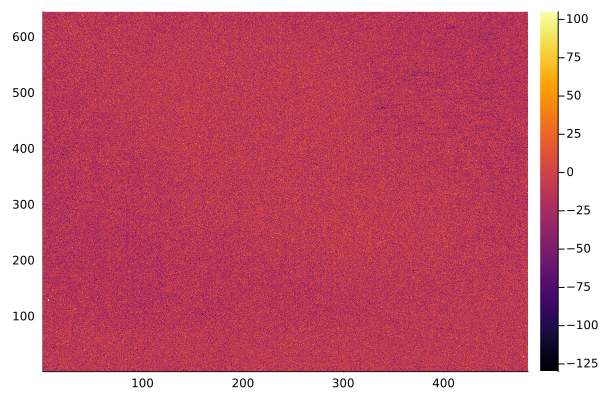

In [28]:
Plots.heatmap(images[9,:,:])

In [29]:
U, S, V = LinearAlgebra.svd(images_flat);
components = reshape(V', shape );

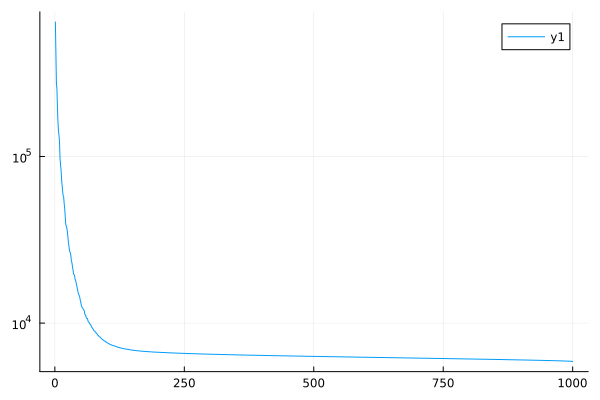

In [30]:
Plots.plot(S, yaxis=:log)

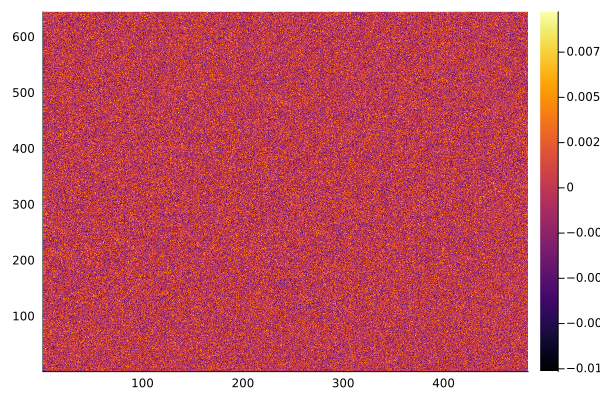

In [32]:
Plots.heatmap(components[end,:,:])

In [149]:
# Now I will define a function that computes the fractional closeness to random of a distribution
# I will start by computing sum (rho log rho)  for each normalized sub distribution
"""
Produces a information theory based measure of the amount of information in a distribution 
assumes the distribution is ordered from large to small and 

normalizes to the information in the full distribution
"""
function distrandom(dist)
    # First reverse the distribution
    rdist = reverse(dist)

    norms = cumsum(rdist)
    logs = log.(rdist)
    logdist = -rdist.*logs
    logdistsum = cumsum(logdist) # this would be the usual von Neuman entropy for a normalized distribution
    vonNeuman = (logdistsum)./norms .+ log.(norms)

    # Normalized to the maximum possible entropy of a distribution distribution of the given length
    vonNeumanNorm = vonNeuman ./ log.(1:size(rdist)[1]);
    vonNeumanNorm = 1 .- vonNeumanNorm

    # Lastly normalize this to its maximum
    vonNeumanNorm ./= vonNeumanNorm[1]

    return reverse(vonNeumanNorm)
end

ans = distrandom(S);


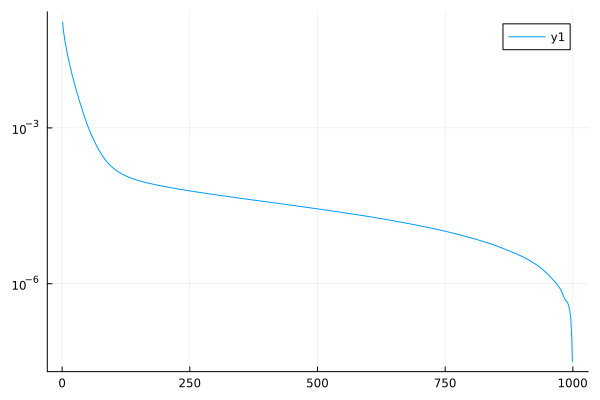

In [150]:
Plots.plot(ans, yaxis=:log)

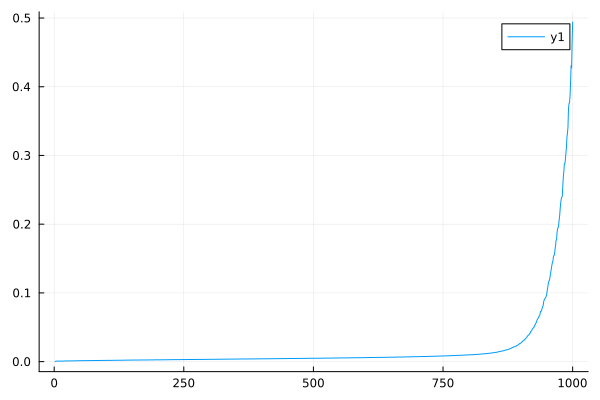

In [88]:
Plots.plot(vonNeumanNorm)


In [85]:
Array([1,2,3]).*Array([3,2,1])

3-element Vector{Int64}:
 3
 4
 3